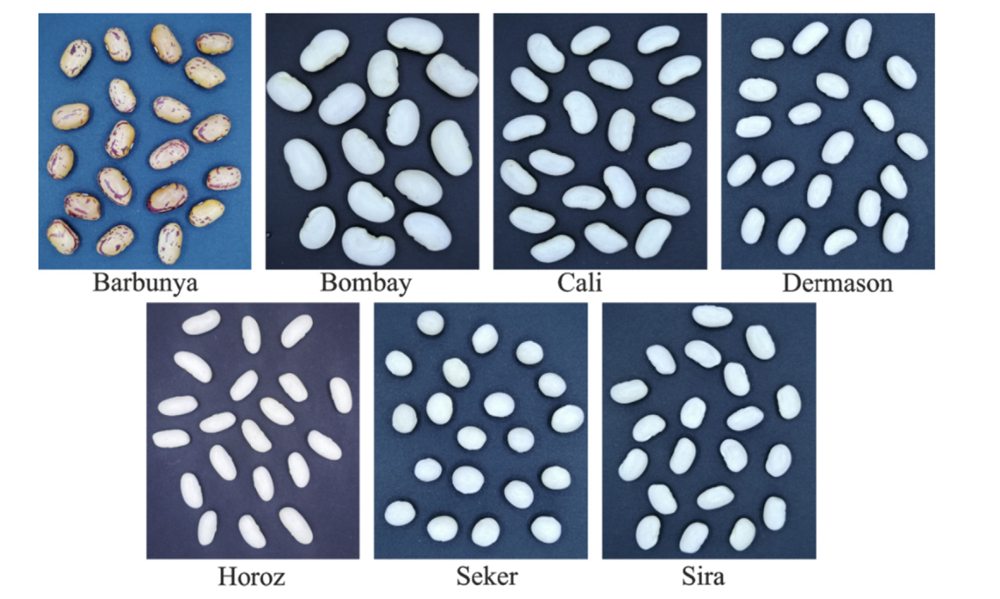

In [1]:
## implot lib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer,StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import accuracy_score
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
import seaborn as sns
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import plotly.express as px
import math
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")
#Some Styling
import plotly.io as pio
pio.templates.default = "plotly_dark"
sns.set_style("darkgrid")

#displaying markdown
sns.set(font_scale=1.2)
from IPython.display import Markdown
def bold(string):
    display(Markdown(string))

    

In [2]:
#load data
train = pd.read_csv( './train.csv')
test = pd.read_csv( './test.csv')


In [300]:
train.head()

,ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,y
0,0,58238,971.303,397.202654,186.945510,2.124697,0.882317,58977,272.306674,0.604756,0.987470,0.775723,0.685561,0.006820,0.000929,0.469994,0.998595,HOROZ
1,1,44515,757.601,265.590470,213.967453,1.241266,0.592420,44780,238.071960,0.771745,0.994082,0.974620,0.896387,0.005966,0.002376,0.803510,0.997370,SEKER
2,2,31662,653.783,239.902428,168.421505,1.424417,0.712136,32034,200.781748,0.801407,0.988387,0.930853,0.836931,0.007577,0.002293,0.700453,0.997737,DERMASON
3,3,38778,734.020,268.446281,184.061923,1.458456,0.727925,39208,222.201897,0.766137,0.989033,0.904439,0.827733,0.006923,0.002005,0.685142,0.999250,DERMASON
4,4,42530,775.403,281.212824,193.236878,1.455275,0.726511,43028,232.703412,0.729816,0.988426,0.888895,0.827499,0.006612,0.001912,0.684755,0.996507,SIRA


In [301]:
# print(train.info())
# train.describe()

In [302]:
# #check null
# train.isnull().sum()

In [303]:
#check duplicated
# train.duplicated().sum()

In [304]:
train.columns

Index(['ID', 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'y'],
      dtype='object')

# Data Exploration

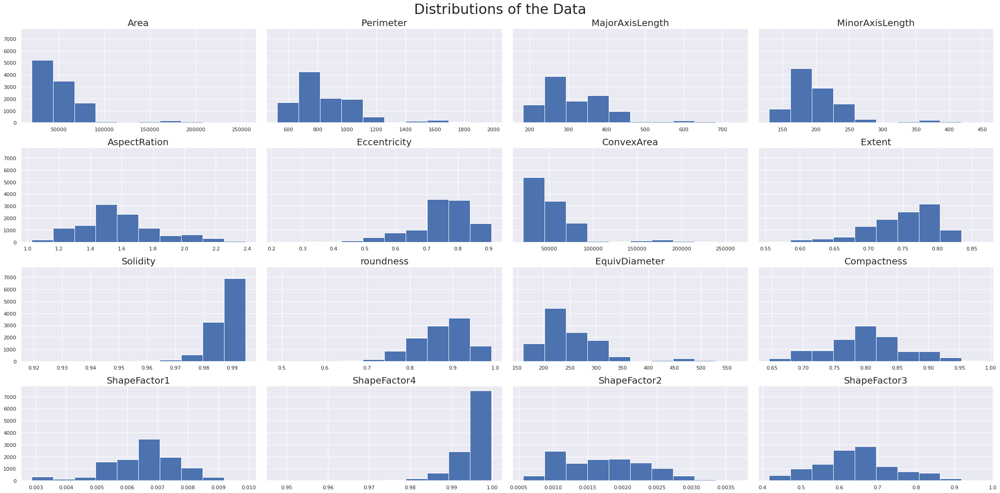

In [305]:
fig, axs = plt.subplots(4, 4, sharey=True, tight_layout=True,figsize=(30,15))
fig.suptitle('Distributions of the Data', fontsize=30)

axs[0,0].hist(train['Area'])
axs[0,0].set_title("Area",fontsize=20)

axs[0,1].hist(train['Perimeter'])
axs[0,1].set_title('Perimeter',fontsize=20)

axs[0,2].hist(train['MajorAxisLength'])
axs[0,2].set_title('MajorAxisLength',fontsize=20)

axs[0,3].hist(train['MinorAxisLength'])
axs[0,3].set_title('MinorAxisLength',fontsize=20)

axs[1,0].hist(train['AspectRation'])
axs[1,0].set_title('AspectRation',fontsize=20)

axs[1,1].hist(train['Eccentricity'])
axs[1,1].set_title('Eccentricity',fontsize=20)

axs[1,2].hist(train['ConvexArea'])
axs[1,2].set_title('ConvexArea',fontsize=20)

axs[1,3].hist(train['Extent'])
axs[1,3].set_title('Extent',fontsize=20)

axs[2,0].hist(train['Solidity'])
axs[2,0].set_title('Solidity',fontsize=20)

axs[2,1].hist(train['roundness'])
axs[2,1].set_title('roundness',fontsize=20)

axs[2,2].hist(train['EquivDiameter'])
axs[2,2].set_title('EquivDiameter',fontsize=20)

axs[2,3].hist(train['Compactness'])
axs[2,3].set_title("Compactness",fontsize=20)

axs[3,0].hist(train['ShapeFactor1'])
axs[3,0].set_title('ShapeFactor1',fontsize=20)

axs[3,1].hist(train['ShapeFactor4'])
axs[3,1].set_title('ShapeFactor4',fontsize=20)

axs[3,2].hist(train['ShapeFactor2'])
axs[3,2].set_title('ShapeFactor2',fontsize=20)

axs[3,3].hist(train['ShapeFactor3'])
axs[3,3].set_title('ShapeFactor3',fontsize=20)

plt.show()


### Distribution of the classes

In [3]:
fig = px.pie(train,names="y",height=400,width=850)
fig.update_traces(textposition='inside')
fig.show()

<AxesSubplot:>

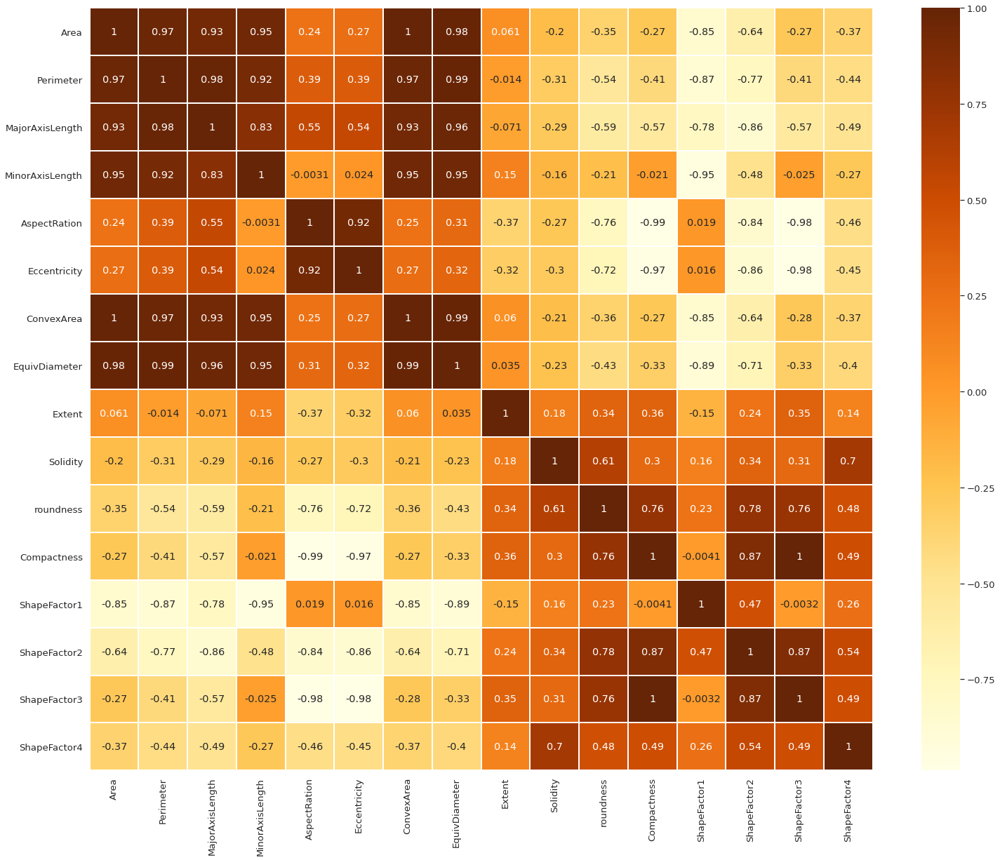

In [70]:
beans = train.iloc[:,1:-1]
beans_corr = beans.corr()
fig = plt.figure(figsize=(25,20))
sns.heatmap(beans_corr,annot=True,linewidths=.3,cmap='YlOrBr')


## Check the correlation between the features and the target

In [308]:
from scipy.stats import spearmanr,kendalltau
corr = pd.DataFrame()
corr['Features']=train.columns
corr['Correaltion with target']=0
for i in range(1,18,1):
    corr.iloc[i,1] = abs((kendalltau(train.iloc[:,i],train['y']))[0])
corr.sort_values(by='Correaltion with target',ascending=False)

,Features,Correaltion with target
17,y,1.000000
11,roundness,0.241762
10,Solidity,0.230039
2,Perimeter,0.215257
3,MajorAxisLength,0.206582
7,ConvexArea,0.201338
8,EquivDiameter,0.200776
1,Area,0.200776
14,ShapeFactor2,0.200615
13,ShapeFactor1,0.164213


In [309]:
for i in range(1,17,1):
    fig = px.scatter(train,x='Area',y=train.columns[i],color='y',width=800,height=400)
    fig.show()

In [310]:
train.columns

Index(['ID', 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'y'],
      dtype='object')

In [59]:
#load data
train = pd.read_csv( './train.csv')
test = pd.read_csv( './test.csv')


## Data preprocessing

In [60]:
def Data_preprocessing(dataframe,normalize=False):
    
    df = dataframe.copy()
    
    # Data Transformation for skewed features
    cols_log = ["Area",'Perimeter', 'MajorAxisLength', 'MinorAxisLength','ConvexArea', 'EquivDiameter']
    cols_pow = ['Eccentricity','Extent','Solidity', 'roundness','ShapeFactor4']
                
#     df[cols_log] = pd.DataFrame(np.log(df[cols_log]))
    
#     df[cols_pow] = pd.DataFrame(np.power(df[cols_pow],2))
    df['Latus Rectum']= ((((1/2)*df['MinorAxisLength'])**2)*2)/((df['MajorAxisLength']/2))

    if normalize == True:
    # Data Normalization (for numerical features) 
        columns_to_normalize = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4']       
        
        scaler = StandardScaler()
        df[columns_to_normalize] = pd.DataFrame(scaler.fit_transform(df[columns_to_normalize]))
    df.drop(columns=["ID",'EquivDiameter'],inplace=True)
#     df.drop(columns=["ShapeFactor1","ShapeFactor2","ShapeFactor3","Perimeter", 
#                      "MajorAxisLength", "MinorAxisLength","Eccentricity","ConvexArea",
#                      "EquivDiameter","Compactness"],inplace=True)
    return df

In [61]:
total_data = pd.read_csv("./Dry_Bean_Dataset.csv", encoding = 'latin1', error_bad_lines=False)
l=[]
l=list(round(test['AspectRation'],9))
p=[]
for i in range (len(l)):
    
    test_data_indeces=pd.DataFrame(total_data[round(total_data['AspectRation'],9)==l[i]]['Class'])
    p.append(test_data_indeces['Class'].iloc[0])

len(round(test['AspectRation'],7).unique().tolist())
true = pd.DataFrame(p)
true = true.rename(columns={0: "Class"})

In [63]:
test1 = Data_preprocessing(test,0)
test1

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Latus Rectum
0,57659,955.434,387.757607,196.625782,1.972059,0.861896,60188,0.620790,0.957982,0.793735,0.698760,0.006725,0.000989,0.488266,0.962889,19.941168
1,28772,630.362,229.990785,159.609367,1.440960,0.719993,29127,0.767458,0.987812,0.909913,0.832204,0.007994,0.002365,0.692563,0.997956,22.153192
2,54677,911.022,308.853903,226.398571,1.364204,0.680198,55858,0.753013,0.978857,0.827860,0.854288,0.005649,0.001856,0.729808,0.995607,33.191300
3,24827,578.304,214.192699,147.788172,1.449322,0.723831,25121,0.716508,0.988297,0.932871,0.830066,0.008627,0.002526,0.689009,0.998596,20.394107
4,141850,1432.847,524.923471,346.910920,1.513136,0.750492,143680,0.804617,0.987263,0.868240,0.809606,0.003701,0.000981,0.655462,0.991803,45.853231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2704,66833,1018.336,400.397077,214.346215,1.867992,0.844640,67787,0.759604,0.985927,0.809876,0.728550,0.005991,0.001041,0.530786,0.991504,22.949368
2705,40572,725.331,250.714014,206.471935,1.214276,0.567264,40900,0.767479,0.991980,0.969089,0.906546,0.006179,0.002574,0.821825,0.997923,34.007401
2706,61226,1008.378,408.227467,199.385082,2.047432,0.872611,63901,0.611648,0.958138,0.756657,0.683944,0.006668,0.000900,0.467780,0.957748,19.476598
2707,34238,698.847,255.829224,170.867099,1.497241,0.744255,34724,0.724890,0.986004,0.880956,0.816130,0.007472,0.002045,0.666067,0.997263,22.824261


In [41]:
train_copy = Data_preprocessing(train,0)

train_copy['z'] = pd.DataFrame(np.abs(stats.zscore(train_copy['Area'])))
train_copy = train_copy[train_copy['z']<5.5]
train_copy = train_copy.drop(columns=['z'])
train_copy['z'] = pd.DataFrame(np.abs(stats.zscore(train_copy['Perimeter'])))
train_copy = train_copy[train_copy['z']<5.5]
train_copy = train_copy.drop(columns=['z'])
train_copy['z'] = pd.DataFrame(np.abs(stats.zscore(train_copy['Eccentricity'])))
train_copy = train_copy[train_copy['z']<5.5]
train_copy = train_copy.drop(columns=['z'])
train_copy['z'] = pd.DataFrame(np.abs(stats.zscore(train_copy['Compactness'])))
train_copy = train_copy[train_copy['z']<5.5]
train_copy = train_copy.drop(columns=['z'])


In [64]:
train_copy.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,y,Latus Rectum
0,58238,971.303,397.202654,186.945510,2.124697,0.882317,58977,0.604756,0.987470,0.775723,0.685561,0.006820,0.000929,0.469994,0.998595,HOROZ,17.597377
1,44515,757.601,265.590470,213.967453,1.241266,0.592420,44780,0.771745,0.994082,0.974620,0.896387,0.005966,0.002376,0.803510,0.997370,SEKER,34.475688
2,31662,653.783,239.902428,168.421505,1.424417,0.712136,32034,0.801407,0.988387,0.930853,0.836931,0.007577,0.002293,0.700453,0.997737,DERMASON,23.647783
3,38778,734.020,268.446281,184.061923,1.458456,0.727925,39208,0.766137,0.989033,0.904439,0.827733,0.006923,0.002005,0.685142,0.999250,DERMASON,25.240649
4,42530,775.403,281.212824,193.236878,1.455275,0.726511,43028,0.729816,0.988426,0.888895,0.827499,0.006612,0.001912,0.684755,0.996507,SIRA,26.556748


In [43]:
# #drop-features
# train_copy = train.drop(["Perimeter", "MajorAxisLength", "MinorAxisLength","Eccentricity","ConvexArea", "EquivDiameter","Compactness","ShapeFactor2", "ShapeFactor3"], axis=1)
# test_copy = test.drop(["Perimeter", "MajorAxisLength", "MinorAxisLength","Eccentricity","ConvexArea", "EquivDiameter","Compactness","ShapeFactor2", "ShapeFactor3"], axis=1)

In [65]:
## Train Data splitting
train_df, val_df = train_test_split(train_copy, test_size=0.1, random_state=42,stratify=train_copy['y'])
X_train = train_df.drop(columns=[ 'y'])
X_val = val_df.drop(columns=['y'])
y_val = val_df['y']
y_train = train_df['y']

In [28]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import np_utils
encoder = LabelEncoder()
encoder.fit(y_train)
encoded_Y = encoder.transform(y_train)
dummy_y = np_utils.to_categorical(encoded_Y)

encoder.fit(y_val)
encoded_Y_val = encoder.transform(y_val)
dummy_y_val = np_utils.to_categorical(encoded_Y_val)


2021-09-27 20:56:15.319441: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-09-27 20:56:15.319469: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [414]:
# from sklearn.ensemble import ExtraTreesClassifier
# ext = ExtraTreesClassifier(n_estimators=800,max_depth=12)
# ext.fit(X_train,y_train)
# print(ext.score(X_train,y_train))
# ext.score(X_val,y_val)

In [415]:
# from sklearn import metrics
# p = ext.predict(X_val)
# metrics.precision_score(p,y_val,average='micro')*100

In [416]:
import keras 
from keras.layers import Dense
from keras.models import Sequential

model = Sequential()
model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32,activation='relu'))
model.add(Dense(16,activation='relu'))
model.add(Dense(8,activation='relu'))
model.add(Dense(7,activation='relu'))


model.add(Dense(7, activation='softmax'))
# Compile model
model.compile(loss='categorical_crossentropy', optimizer = keras.optimizers.SGD(), metrics=['CategoricalAccuracy'])
history = model.fit(X_train,dummy_y,epochs=200, validation_data=(X_val, dummy_y_val))


Epoch 1/200
305/305 [==============================] - 0s 857us/step - loss: 1.8767 - categorical_accuracy: 0.3166 - val_loss: 1.6433 - val_categorical_accuracy: 0.4170
Epoch 2/200
305/305 [==============================] - 0s 528us/step - loss: 1.5370 - categorical_accuracy: 0.4455 - val_loss: 1.2263 - val_categorical_accuracy: 0.5830
Epoch 3/200
305/305 [==============================] - 0s 530us/step - loss: 1.0981 - categorical_accuracy: 0.6195 - val_loss: 0.8405 - val_categorical_accuracy: 0.6651
Epoch 4/200
305/305 [==============================] - 0s 543us/step - loss: 0.7794 - categorical_accuracy: 0.6670 - val_loss: 0.6462 - val_categorical_accuracy: 0.8007
Epoch 5/200
305/305 [==============================] - 0s 555us/step - loss: 0.5812 - categorical_accuracy: 0.8258 - val_loss: 0.4439 - val_categorical_accuracy: 0.8828
Epoch 6/200
305/305 [==============================] - 0s 543us/step - loss: 0.3854 - categorical_accuracy: 0.8932 - val_loss: 0.3183 - val_categorical_acc

305/305 [==============================] - 0s 545us/step - loss: 0.1781 - categorical_accuracy: 0.9334 - val_loss: 0.2089 - val_categorical_accuracy: 0.9308
Epoch 98/200
305/305 [==============================] - 0s 570us/step - loss: 0.1747 - categorical_accuracy: 0.9345 - val_loss: 0.2245 - val_categorical_accuracy: 0.9244
Epoch 99/200
305/305 [==============================] - 0s 565us/step - loss: 0.1802 - categorical_accuracy: 0.9349 - val_loss: 0.2177 - val_categorical_accuracy: 0.9290
Epoch 100/200
305/305 [==============================] - 0s 575us/step - loss: 0.1759 - categorical_accuracy: 0.9352 - val_loss: 0.2197 - val_categorical_accuracy: 0.9234
Epoch 101/200
305/305 [==============================] - 0s 561us/step - loss: 0.1781 - categorical_accuracy: 0.9357 - val_loss: 0.2115 - val_categorical_accuracy: 0.9299
Epoch 102/200
305/305 [==============================] - 0s 551us/step - loss: 0.1769 - categorical_accuracy: 0.9339 - val_loss: 0.2207 - val_categorical_accurac

305/305 [==============================] - 0s 573us/step - loss: 0.1736 - categorical_accuracy: 0.9385 - val_loss: 0.2336 - val_categorical_accuracy: 0.9188
Epoch 146/200
305/305 [==============================] - 0s 540us/step - loss: 0.1618 - categorical_accuracy: 0.9410 - val_loss: 0.2150 - val_categorical_accuracy: 0.9280
Epoch 147/200
305/305 [==============================] - 0s 575us/step - loss: 0.1712 - categorical_accuracy: 0.9375 - val_loss: 0.2115 - val_categorical_accuracy: 0.9317
Epoch 148/200
305/305 [==============================] - 0s 563us/step - loss: 0.1718 - categorical_accuracy: 0.9374 - val_loss: 0.2054 - val_categorical_accuracy: 0.9317
Epoch 149/200
305/305 [==============================] - 0s 532us/step - loss: 0.1639 - categorical_accuracy: 0.9399 - val_loss: 0.2075 - val_categorical_accuracy: 0.9308
Epoch 150/200
305/305 [==============================] - 0s 572us/step - loss: 0.1584 - categorical_accuracy: 0.9431 - val_loss: 0.2180 - val_categorical_accur

Epoch 193/200
305/305 [==============================] - 0s 564us/step - loss: 0.1507 - categorical_accuracy: 0.9410 - val_loss: 0.2190 - val_categorical_accuracy: 0.9317
Epoch 194/200
305/305 [==============================] - 0s 548us/step - loss: 0.1519 - categorical_accuracy: 0.9458 - val_loss: 0.2365 - val_categorical_accuracy: 0.9244
Epoch 195/200
305/305 [==============================] - 0s 576us/step - loss: 0.1558 - categorical_accuracy: 0.9415 - val_loss: 0.2435 - val_categorical_accuracy: 0.9262
Epoch 196/200
305/305 [==============================] - 0s 556us/step - loss: 0.1533 - categorical_accuracy: 0.9431 - val_loss: 0.2159 - val_categorical_accuracy: 0.9244
Epoch 197/200
305/305 [==============================] - 0s 590us/step - loss: 0.1545 - categorical_accuracy: 0.9441 - val_loss: 0.2190 - val_categorical_accuracy: 0.9234
Epoch 198/200
305/305 [==============================] - 0s 573us/step - loss: 0.1502 - categorical_accuracy: 0.9418 - val_loss: 0.2255 - val_cat

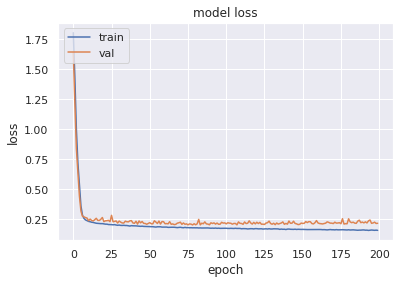

34/34 [==============================] - 0s 413us/step - loss: 0.2163 - categorical_accuracy: 0.9280
Accuracy: 94.67
Accuracy: 92.80


In [417]:
# summarize history for loss

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

accuracy = model.evaluate(X_train, dummy_y)
accuracy_val = model.evaluate(X_val, dummy_y_val)

print('Accuracy: %.2f' % (accuracy[1]*100))
print('Accuracy: %.2f' % (accuracy_val[1]*100))

In [47]:
from sklearn.svm import SVC 
rbf = SVC(kernel='rbf', decision_function_shape='ovo').fit(X_train, y_train)
Z = rbf.predict(X_val)
accuracy_rbf = rbf.score(test1, true)
accuracy_rbf*100

64.23034330011073

In [67]:
cat = CatBoostClassifier(n_estimators = 1500,depth=4, random_state=42,learning_rate=.039,eval_metric='Accuracy' ,use_best_model=True)

cat.fit(X_train, y_train,eval_set=(test1,true))
print('Accuracy of classifier on training set: {:.2f}'.format(cat.score(X_train, y_train) * 100))
print('Accuracy of classifier on test set: {:.2f}'.format(cat.score(X_val, y_val) * 100))
print('Accuracy of classifier on test set: {:.2f}'.format(cat.score(test1, true) * 100))

0:	learn: 0.7836777	test: 0.7918051	best: 0.7918051 (0)	total: 6.46ms	remaining: 9.69s
1:	learn: 0.8230372	test: 0.8301956	best: 0.8301956 (1)	total: 12.5ms	remaining: 9.39s
2:	learn: 0.8333678	test: 0.8394241	best: 0.8394241 (2)	total: 18.5ms	remaining: 9.22s
3:	learn: 0.8511364	test: 0.8519749	best: 0.8519749 (3)	total: 24.7ms	remaining: 9.22s
4:	learn: 0.8484504	test: 0.8523440	best: 0.8523440 (4)	total: 31.1ms	remaining: 9.3s
5:	learn: 0.8483471	test: 0.8516058	best: 0.8523440 (4)	total: 37.1ms	remaining: 9.25s
6:	learn: 0.8551653	test: 0.8564046	best: 0.8564046 (6)	total: 43.4ms	remaining: 9.27s
7:	learn: 0.8454545	test: 0.8497601	best: 0.8564046 (6)	total: 49.4ms	remaining: 9.21s
8:	learn: 0.8575413	test: 0.8597268	best: 0.8597268 (8)	total: 56.2ms	remaining: 9.31s
9:	learn: 0.8584711	test: 0.8615725	best: 0.8615725 (9)	total: 62.8ms	remaining: 9.35s
10:	learn: 0.8579545	test: 0.8578811	best: 0.8615725 (9)	total: 69ms	remaining: 9.35s
11:	learn: 0.8584711	test: 0.8604651	best: 0.

120:	learn: 0.9215909	test: 0.9206349	best: 0.9217423 (116)	total: 808ms	remaining: 9.21s
121:	learn: 0.9217975	test: 0.9202658	best: 0.9217423 (116)	total: 817ms	remaining: 9.23s
122:	learn: 0.9219008	test: 0.9206349	best: 0.9217423 (116)	total: 825ms	remaining: 9.24s
123:	learn: 0.9220041	test: 0.9206349	best: 0.9217423 (116)	total: 832ms	remaining: 9.23s
124:	learn: 0.9219008	test: 0.9206349	best: 0.9217423 (116)	total: 840ms	remaining: 9.24s
125:	learn: 0.9220041	test: 0.9206349	best: 0.9217423 (116)	total: 847ms	remaining: 9.23s
126:	learn: 0.9217975	test: 0.9206349	best: 0.9217423 (116)	total: 853ms	remaining: 9.22s
127:	learn: 0.9220041	test: 0.9210041	best: 0.9217423 (116)	total: 863ms	remaining: 9.25s
128:	learn: 0.9219008	test: 0.9213732	best: 0.9217423 (116)	total: 871ms	remaining: 9.26s
129:	learn: 0.9220041	test: 0.9210041	best: 0.9217423 (116)	total: 877ms	remaining: 9.24s
130:	learn: 0.9221074	test: 0.9210041	best: 0.9217423 (116)	total: 883ms	remaining: 9.23s
131:	learn

230:	learn: 0.9273760	test: 0.9265412	best: 0.9272794 (207)	total: 1.6s	remaining: 8.82s
231:	learn: 0.9273760	test: 0.9265412	best: 0.9272794 (207)	total: 1.62s	remaining: 8.84s
232:	learn: 0.9273760	test: 0.9269103	best: 0.9272794 (207)	total: 1.63s	remaining: 8.85s
233:	learn: 0.9274793	test: 0.9265412	best: 0.9272794 (207)	total: 1.64s	remaining: 8.88s
234:	learn: 0.9275826	test: 0.9269103	best: 0.9272794 (207)	total: 1.65s	remaining: 8.89s
235:	learn: 0.9277893	test: 0.9269103	best: 0.9272794 (207)	total: 1.66s	remaining: 8.89s
236:	learn: 0.9276860	test: 0.9269103	best: 0.9272794 (207)	total: 1.68s	remaining: 8.93s
237:	learn: 0.9277893	test: 0.9269103	best: 0.9272794 (207)	total: 1.69s	remaining: 8.96s
238:	learn: 0.9278926	test: 0.9265412	best: 0.9272794 (207)	total: 1.7s	remaining: 8.99s
239:	learn: 0.9279959	test: 0.9265412	best: 0.9272794 (207)	total: 1.72s	remaining: 9.02s
240:	learn: 0.9280992	test: 0.9261720	best: 0.9272794 (207)	total: 1.73s	remaining: 9.02s
241:	learn: 

336:	learn: 0.9322314	test: 0.9309708	best: 0.9309708 (336)	total: 2.42s	remaining: 8.34s
337:	learn: 0.9322314	test: 0.9309708	best: 0.9309708 (336)	total: 2.42s	remaining: 8.33s
338:	learn: 0.9320248	test: 0.9313400	best: 0.9313400 (338)	total: 2.43s	remaining: 8.32s
339:	learn: 0.9319215	test: 0.9313400	best: 0.9313400 (338)	total: 2.44s	remaining: 8.32s
340:	learn: 0.9319215	test: 0.9313400	best: 0.9313400 (338)	total: 2.44s	remaining: 8.31s
341:	learn: 0.9318182	test: 0.9309708	best: 0.9313400 (338)	total: 2.45s	remaining: 8.3s
342:	learn: 0.9318182	test: 0.9313400	best: 0.9313400 (338)	total: 2.46s	remaining: 8.29s
343:	learn: 0.9318182	test: 0.9313400	best: 0.9313400 (338)	total: 2.46s	remaining: 8.28s
344:	learn: 0.9319215	test: 0.9317091	best: 0.9317091 (344)	total: 2.47s	remaining: 8.27s
345:	learn: 0.9320248	test: 0.9317091	best: 0.9317091 (344)	total: 2.48s	remaining: 8.26s
346:	learn: 0.9323347	test: 0.9317091	best: 0.9317091 (344)	total: 2.48s	remaining: 8.25s
347:	learn:

454:	learn: 0.9370868	test: 0.9324474	best: 0.9328165 (407)	total: 3.2s	remaining: 7.36s
455:	learn: 0.9369835	test: 0.9324474	best: 0.9328165 (407)	total: 3.21s	remaining: 7.35s
456:	learn: 0.9370868	test: 0.9328165	best: 0.9328165 (407)	total: 3.22s	remaining: 7.34s
457:	learn: 0.9371901	test: 0.9324474	best: 0.9328165 (407)	total: 3.22s	remaining: 7.33s
458:	learn: 0.9371901	test: 0.9331857	best: 0.9331857 (458)	total: 3.23s	remaining: 7.33s
459:	learn: 0.9371901	test: 0.9328165	best: 0.9331857 (458)	total: 3.24s	remaining: 7.32s
460:	learn: 0.9371901	test: 0.9328165	best: 0.9331857 (458)	total: 3.24s	remaining: 7.31s
461:	learn: 0.9371901	test: 0.9328165	best: 0.9331857 (458)	total: 3.25s	remaining: 7.3s
462:	learn: 0.9372934	test: 0.9335548	best: 0.9335548 (462)	total: 3.26s	remaining: 7.3s
463:	learn: 0.9371901	test: 0.9335548	best: 0.9335548 (462)	total: 3.26s	remaining: 7.29s
464:	learn: 0.9372934	test: 0.9331857	best: 0.9335548 (462)	total: 3.27s	remaining: 7.28s
465:	learn: 0

574:	learn: 0.9398760	test: 0.9350314	best: 0.9350314 (568)	total: 4s	remaining: 6.44s
575:	learn: 0.9398760	test: 0.9350314	best: 0.9350314 (568)	total: 4.01s	remaining: 6.43s
576:	learn: 0.9397727	test: 0.9350314	best: 0.9350314 (568)	total: 4.01s	remaining: 6.42s
577:	learn: 0.9398760	test: 0.9350314	best: 0.9350314 (568)	total: 4.02s	remaining: 6.41s
578:	learn: 0.9397727	test: 0.9346622	best: 0.9350314 (568)	total: 4.03s	remaining: 6.41s
579:	learn: 0.9397727	test: 0.9346622	best: 0.9350314 (568)	total: 4.04s	remaining: 6.41s
580:	learn: 0.9401860	test: 0.9350314	best: 0.9350314 (568)	total: 4.05s	remaining: 6.4s
581:	learn: 0.9399793	test: 0.9350314	best: 0.9350314 (568)	total: 4.05s	remaining: 6.39s
582:	learn: 0.9399793	test: 0.9350314	best: 0.9350314 (568)	total: 4.06s	remaining: 6.39s
583:	learn: 0.9399793	test: 0.9346622	best: 0.9350314 (568)	total: 4.07s	remaining: 6.39s
584:	learn: 0.9401860	test: 0.9339240	best: 0.9350314 (568)	total: 4.08s	remaining: 6.38s
585:	learn: 0.

691:	learn: 0.9422521	test: 0.9361388	best: 0.9365079 (683)	total: 4.8s	remaining: 5.6s
692:	learn: 0.9422521	test: 0.9361388	best: 0.9365079 (683)	total: 4.8s	remaining: 5.59s
693:	learn: 0.9422521	test: 0.9361388	best: 0.9365079 (683)	total: 4.81s	remaining: 5.59s
694:	learn: 0.9425620	test: 0.9361388	best: 0.9365079 (683)	total: 4.82s	remaining: 5.58s
695:	learn: 0.9425620	test: 0.9361388	best: 0.9365079 (683)	total: 4.82s	remaining: 5.57s
696:	learn: 0.9425620	test: 0.9361388	best: 0.9365079 (683)	total: 4.83s	remaining: 5.57s
697:	learn: 0.9426653	test: 0.9361388	best: 0.9365079 (683)	total: 4.84s	remaining: 5.56s
698:	learn: 0.9426653	test: 0.9361388	best: 0.9365079 (683)	total: 4.85s	remaining: 5.55s
699:	learn: 0.9426653	test: 0.9361388	best: 0.9365079 (683)	total: 4.85s	remaining: 5.54s
700:	learn: 0.9426653	test: 0.9354005	best: 0.9365079 (683)	total: 4.86s	remaining: 5.54s
701:	learn: 0.9426653	test: 0.9357697	best: 0.9365079 (683)	total: 4.87s	remaining: 5.53s
702:	learn: 0

809:	learn: 0.9438017	test: 0.9354005	best: 0.9365079 (683)	total: 5.59s	remaining: 4.76s
810:	learn: 0.9438017	test: 0.9354005	best: 0.9365079 (683)	total: 5.6s	remaining: 4.76s
811:	learn: 0.9439050	test: 0.9354005	best: 0.9365079 (683)	total: 5.61s	remaining: 4.75s
812:	learn: 0.9440083	test: 0.9354005	best: 0.9365079 (683)	total: 5.61s	remaining: 4.74s
813:	learn: 0.9441116	test: 0.9354005	best: 0.9365079 (683)	total: 5.62s	remaining: 4.74s
814:	learn: 0.9441116	test: 0.9354005	best: 0.9365079 (683)	total: 5.63s	remaining: 4.73s
815:	learn: 0.9442149	test: 0.9354005	best: 0.9365079 (683)	total: 5.64s	remaining: 4.72s
816:	learn: 0.9442149	test: 0.9354005	best: 0.9365079 (683)	total: 5.64s	remaining: 4.72s
817:	learn: 0.9442149	test: 0.9354005	best: 0.9365079 (683)	total: 5.65s	remaining: 4.71s
818:	learn: 0.9442149	test: 0.9354005	best: 0.9365079 (683)	total: 5.66s	remaining: 4.71s
819:	learn: 0.9442149	test: 0.9354005	best: 0.9365079 (683)	total: 5.67s	remaining: 4.7s
820:	learn: 

925:	learn: 0.9457645	test: 0.9354005	best: 0.9365079 (683)	total: 6.39s	remaining: 3.96s
926:	learn: 0.9457645	test: 0.9354005	best: 0.9365079 (683)	total: 6.4s	remaining: 3.96s
927:	learn: 0.9458678	test: 0.9354005	best: 0.9365079 (683)	total: 6.41s	remaining: 3.95s
928:	learn: 0.9458678	test: 0.9354005	best: 0.9365079 (683)	total: 6.41s	remaining: 3.94s
929:	learn: 0.9458678	test: 0.9354005	best: 0.9365079 (683)	total: 6.42s	remaining: 3.94s
930:	learn: 0.9458678	test: 0.9354005	best: 0.9365079 (683)	total: 6.43s	remaining: 3.93s
931:	learn: 0.9458678	test: 0.9354005	best: 0.9365079 (683)	total: 6.43s	remaining: 3.92s
932:	learn: 0.9458678	test: 0.9354005	best: 0.9365079 (683)	total: 6.44s	remaining: 3.91s
933:	learn: 0.9458678	test: 0.9350314	best: 0.9365079 (683)	total: 6.45s	remaining: 3.91s
934:	learn: 0.9458678	test: 0.9350314	best: 0.9365079 (683)	total: 6.46s	remaining: 3.9s
935:	learn: 0.9458678	test: 0.9350314	best: 0.9365079 (683)	total: 6.46s	remaining: 3.89s
936:	learn: 

1017:	learn: 0.9478306	test: 0.9342931	best: 0.9365079 (683)	total: 7s	remaining: 3.31s
1018:	learn: 0.9480372	test: 0.9342931	best: 0.9365079 (683)	total: 7s	remaining: 3.31s
1019:	learn: 0.9479339	test: 0.9342931	best: 0.9365079 (683)	total: 7.01s	remaining: 3.3s
1020:	learn: 0.9479339	test: 0.9339240	best: 0.9365079 (683)	total: 7.02s	remaining: 3.29s
1021:	learn: 0.9479339	test: 0.9342931	best: 0.9365079 (683)	total: 7.02s	remaining: 3.28s
1022:	learn: 0.9481405	test: 0.9342931	best: 0.9365079 (683)	total: 7.03s	remaining: 3.28s
1023:	learn: 0.9480372	test: 0.9342931	best: 0.9365079 (683)	total: 7.04s	remaining: 3.27s
1024:	learn: 0.9479339	test: 0.9342931	best: 0.9365079 (683)	total: 7.04s	remaining: 3.26s
1025:	learn: 0.9479339	test: 0.9342931	best: 0.9365079 (683)	total: 7.05s	remaining: 3.26s
1026:	learn: 0.9481405	test: 0.9339240	best: 0.9365079 (683)	total: 7.06s	remaining: 3.25s
1027:	learn: 0.9481405	test: 0.9339240	best: 0.9365079 (683)	total: 7.07s	remaining: 3.24s
1028:	

1131:	learn: 0.9495868	test: 0.9324474	best: 0.9365079 (683)	total: 8s	remaining: 2.6s
1132:	learn: 0.9492769	test: 0.9324474	best: 0.9365079 (683)	total: 8.01s	remaining: 2.59s
1133:	learn: 0.9492769	test: 0.9324474	best: 0.9365079 (683)	total: 8.01s	remaining: 2.59s
1134:	learn: 0.9492769	test: 0.9324474	best: 0.9365079 (683)	total: 8.02s	remaining: 2.58s
1135:	learn: 0.9492769	test: 0.9324474	best: 0.9365079 (683)	total: 8.03s	remaining: 2.57s
1136:	learn: 0.9492769	test: 0.9328165	best: 0.9365079 (683)	total: 8.04s	remaining: 2.57s
1137:	learn: 0.9493802	test: 0.9328165	best: 0.9365079 (683)	total: 8.05s	remaining: 2.56s
1138:	learn: 0.9493802	test: 0.9328165	best: 0.9365079 (683)	total: 8.06s	remaining: 2.55s
1139:	learn: 0.9493802	test: 0.9320783	best: 0.9365079 (683)	total: 8.07s	remaining: 2.55s
1140:	learn: 0.9494835	test: 0.9320783	best: 0.9365079 (683)	total: 8.07s	remaining: 2.54s
1141:	learn: 0.9494835	test: 0.9320783	best: 0.9365079 (683)	total: 8.08s	remaining: 2.53s
114

1226:	learn: 0.9514463	test: 0.9320783	best: 0.9365079 (683)	total: 8.8s	remaining: 1.96s
1227:	learn: 0.9513430	test: 0.9320783	best: 0.9365079 (683)	total: 8.8s	remaining: 1.95s
1228:	learn: 0.9513430	test: 0.9320783	best: 0.9365079 (683)	total: 8.82s	remaining: 1.94s
1229:	learn: 0.9513430	test: 0.9320783	best: 0.9365079 (683)	total: 8.82s	remaining: 1.94s
1230:	learn: 0.9513430	test: 0.9320783	best: 0.9365079 (683)	total: 8.83s	remaining: 1.93s
1231:	learn: 0.9514463	test: 0.9320783	best: 0.9365079 (683)	total: 8.84s	remaining: 1.92s
1232:	learn: 0.9513430	test: 0.9320783	best: 0.9365079 (683)	total: 8.85s	remaining: 1.92s
1233:	learn: 0.9513430	test: 0.9317091	best: 0.9365079 (683)	total: 8.86s	remaining: 1.91s
1234:	learn: 0.9512397	test: 0.9317091	best: 0.9365079 (683)	total: 8.86s	remaining: 1.9s
1235:	learn: 0.9511364	test: 0.9317091	best: 0.9365079 (683)	total: 8.87s	remaining: 1.89s
1236:	learn: 0.9512397	test: 0.9317091	best: 0.9365079 (683)	total: 8.88s	remaining: 1.89s
12

1342:	learn: 0.9527893	test: 0.9331857	best: 0.9365079 (683)	total: 9.59s	remaining: 1.12s
1343:	learn: 0.9527893	test: 0.9331857	best: 0.9365079 (683)	total: 9.6s	remaining: 1.11s
1344:	learn: 0.9525826	test: 0.9331857	best: 0.9365079 (683)	total: 9.6s	remaining: 1.11s
1345:	learn: 0.9527893	test: 0.9331857	best: 0.9365079 (683)	total: 9.61s	remaining: 1.1s
1346:	learn: 0.9527893	test: 0.9331857	best: 0.9365079 (683)	total: 9.62s	remaining: 1.09s
1347:	learn: 0.9526860	test: 0.9331857	best: 0.9365079 (683)	total: 9.63s	remaining: 1.08s
1348:	learn: 0.9526860	test: 0.9328165	best: 0.9365079 (683)	total: 9.63s	remaining: 1.08s
1349:	learn: 0.9527893	test: 0.9324474	best: 0.9365079 (683)	total: 9.64s	remaining: 1.07s
1350:	learn: 0.9527893	test: 0.9324474	best: 0.9365079 (683)	total: 9.65s	remaining: 1.06s
1351:	learn: 0.9527893	test: 0.9324474	best: 0.9365079 (683)	total: 9.65s	remaining: 1.06s
1352:	learn: 0.9528926	test: 0.9328165	best: 0.9365079 (683)	total: 9.66s	remaining: 1.05s
13

1458:	learn: 0.9543388	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 292ms
1459:	learn: 0.9542355	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 285ms
1460:	learn: 0.9541322	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 278ms
1461:	learn: 0.9542355	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 270ms
1462:	learn: 0.9543388	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 263ms
1463:	learn: 0.9543388	test: 0.9339240	best: 0.9365079 (683)	total: 10.4s	remaining: 256ms
1464:	learn: 0.9542355	test: 0.9339240	best: 0.9365079 (683)	total: 10.4s	remaining: 249ms
1465:	learn: 0.9541322	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 242ms
1466:	learn: 0.9543388	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 235ms
1467:	learn: 0.9542355	test: 0.9335548	best: 0.9365079 (683)	total: 10.4s	remaining: 228ms
1468:	learn: 0.9544421	test: 0.9335548	best: 0.9365079 (683)	total: 10.5s	remaining: 221ms

In [58]:
import catboost
catboost.__version__

'0.26.1'

In [513]:
from sklearn import metrics
p = cat.predict(X_val)
metrics.precision_score(p,y_val,average='micro')*100

94.00369003690037

In [473]:
cat.get_feature_importance(prettified=True)

,Feature Id,Importances
0,Area,47.104339
1,AspectRation,28.708440
2,roundness,9.743111
3,ShapeFactor4,7.009348
4,Solidity,4.126641
5,Extent,3.308121


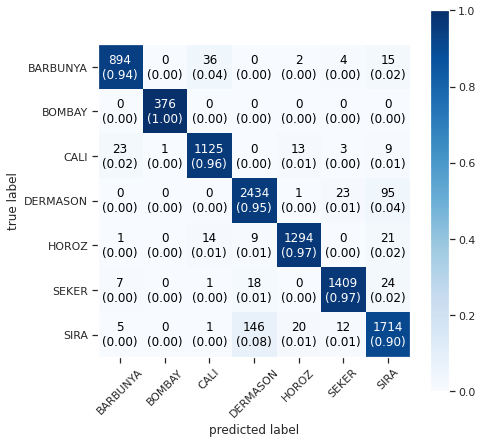

In [474]:
import mlxtend
from mlxtend.plotting import plot_confusion_matrix
predt = cat.predict(X_train)
classes  = np.array(["BARBUNYA","BOMBAY","CALI","DERMASON","HOROZ","SEKER","SIRA"])
cm = confusion_matrix(y_train, predt)

figure, ax = plot_confusion_matrix(conf_mat = cm, colorbar = True,class_names=classes,show_normed = True, figsize=(7, 7)
    )

plt.show()

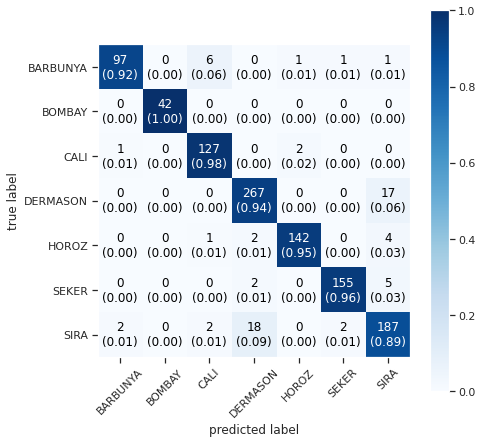

In [252]:
import mlxtend
from mlxtend.plotting import plot_confusion_matrix
predv = cat.predict(X_val)
classes  = np.array(["BARBUNYA","BOMBAY","CALI","DERMASON","HOROZ","SEKER","SIRA"])
cm = confusion_matrix(y_val, predv)

figure, ax = plot_confusion_matrix(conf_mat = cm, colorbar = True,class_names=classes,show_normed = True, figsize=(7, 7)
                                  )

plt.show()

In [514]:
X_test = Data_preprocessing(test,0)
X_test

,ID,Area,AspectRation,Extent,Solidity,roundness,ShapeFactor4,y
0,10834,57659,1.972059,0.620790,0.957982,0.793735,0.962889,0
1,10835,28772,1.440960,0.767458,0.987812,0.909913,0.997956,0
2,10836,54677,1.364204,0.753013,0.978857,0.827860,0.995607,0
3,10837,24827,1.449322,0.716508,0.988297,0.932871,0.998596,0
4,10838,141850,1.513136,0.804617,0.987263,0.868240,0.991803,0
...,...,...,...,...,...,...,...,...
2704,13538,66833,1.867992,0.759604,0.985927,0.809876,0.991504,0
2705,13539,40572,1.214276,0.767479,0.991980,0.969089,0.997923,0
2706,13540,61226,2.047432,0.611648,0.958138,0.756657,0.957748,0
2707,13541,34238,1.497241,0.724890,0.986004,0.880956,0.997263,0


In [485]:
X_test = test.drop(columns=['ID'])
y_test_predicted = cat.predict(X_test) 
test['y'] = y_test_predicted
submission = test[['ID', 'y']]
submission.head()

,ID,y
0,10834,BOMBAY
1,10835,BOMBAY
2,10836,BOMBAY
3,10837,BOMBAY
4,10838,BOMBAY
5,10839,BOMBAY
6,10840,BOMBAY
7,10841,BOMBAY
8,10842,BOMBAY
9,10843,BOMBAY
